# Plant Diseases Prediction

## Download Data

In [1]:
import os
if os.path.isdir("./data") is False:
  !gdown --id 1e_JevN1JxStG8Dn6mRCnCH-l_WOGOVhB
  !unzip plant-pathology.zip -d data
  !rm plant-pathology.zip

Downloading...
From: https://drive.google.com/uc?id=1e_JevN1JxStG8Dn6mRCnCH-l_WOGOVhB
To: /content/plant-pathology.zip
817MB [00:13, 62.8MB/s]
Archive:  plant-pathology.zip
  inflating: data/images/Test_0.jpg  
  inflating: data/images/Test_1.jpg  
  inflating: data/images/Test_10.jpg  
  inflating: data/images/Test_100.jpg  
  inflating: data/images/Test_1000.jpg  
  inflating: data/images/Test_1001.jpg  
  inflating: data/images/Test_1002.jpg  
  inflating: data/images/Test_1003.jpg  
  inflating: data/images/Test_1004.jpg  
  inflating: data/images/Test_1005.jpg  
  inflating: data/images/Test_1006.jpg  
  inflating: data/images/Test_1007.jpg  
  inflating: data/images/Test_1008.jpg  
  inflating: data/images/Test_1009.jpg  
  inflating: data/images/Test_101.jpg  
  inflating: data/images/Test_1010.jpg  
  inflating: data/images/Test_1011.jpg  
  inflating: data/images/Test_1012.jpg  
  inflating: data/images/Test_1013.jpg  
  inflating: data/images/Test_1014.jpg  
  inflating: data

## Init Some Constance

In [2]:
import tensorflow as tf
import numpy as np
import zipfile
import random
import shutil
from shutil import copyfile
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [3]:
DATA_PATH = './data'
VALID_RATIO = 0.1
TRAIN_PATH = f'{DATA_PATH}/train'
VALID_PATH = f'{DATA_PATH}/valid'
TEST_PATH = f'{DATA_PATH}/test'
BATCH_SIZE = 32
IMAGE_SIZE = (300, 300)
IMAGE_SHAPE = (IMAGE_SIZE[0], IMAGE_SIZE[1], 3)
MAX_ACC = 0.97
BASE_LEARNING_RATE = 0.0001

## Data Preparation

In [4]:
train = pd.read_csv(f'{DATA_PATH}/train.csv')
diseases = list(train)[1:]
test = pd.read_csv(f'{DATA_PATH}/test.csv')
train['image_id']=train['image_id']+'.jpg'
test['image_id']=test['image_id']+'.jpg'
train.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0.jpg,0,0,0,1
1,Train_1.jpg,0,1,0,0
2,Train_2.jpg,1,0,0,0
3,Train_3.jpg,0,0,1,0
4,Train_4.jpg,1,0,0,0


## EDA

### Diseases distribution

In [5]:
import cv2
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import seaborn as sns

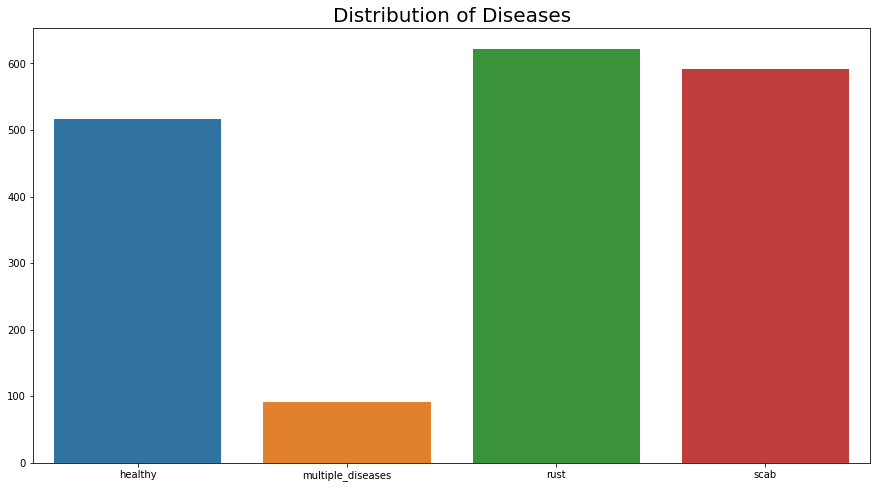

In [6]:
counter = []
plt.figure(figsize=(15,8))
plt.title("Distribution of Diseases", fontsize=20)
for disease in diseases:
    counter.append(train[train[disease] == 1].count().image_id)
sns.barplot(x = diseases, y = counter)

- Nhận xét phân phối số lượng loại bệnh
    - Tỷ lệ cây **khỏe mạnh**, cây bị bệnh **rust**, cây bị bệnh **scab** là tương đương nhau. Trong đó, cây bị bệnh **rust** nhỉnh hơn một chút về số lượng
    - Tỷ lệ cây mắc **multiple_diseases** là thấp nhất, chỉ bằng khoảng 1/5 so với số lượng cây **khỏe mạnh**

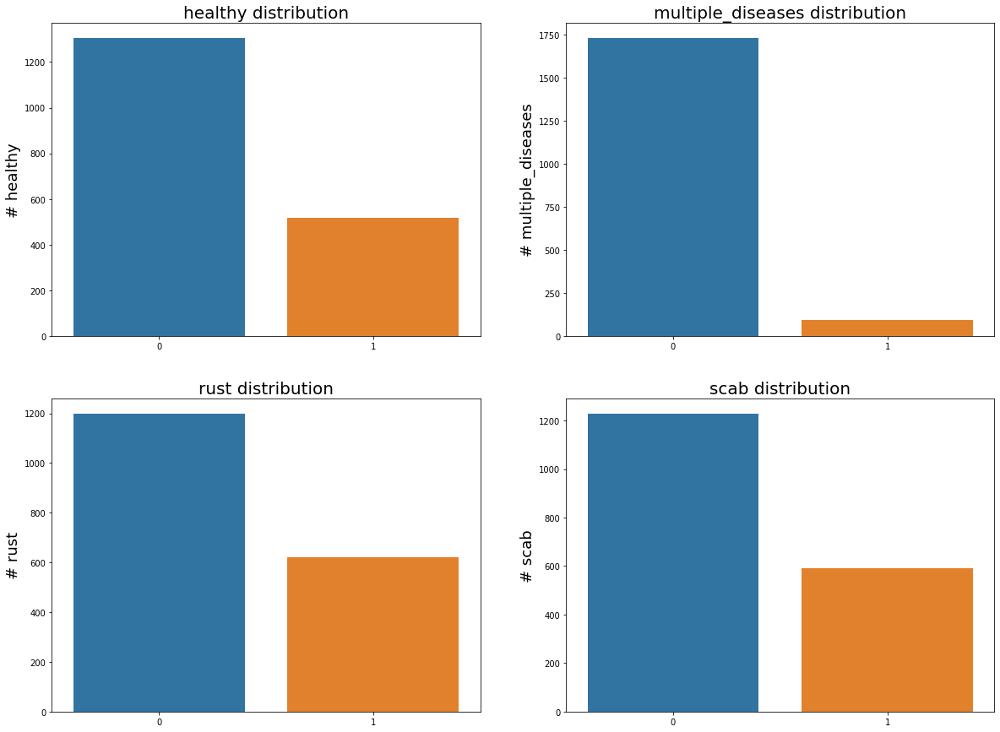

In [7]:
fig,axes=plt.subplots(2,2,figsize=(20, 15))
for row in range(2):
  for col in range(2):
    sns.barplot(y=train[diseases[row * 2 + col]].value_counts() , x=train[diseases[row * 2 + col]].value_counts().index,ax=axes[row, col])
    axes[row, col].set_title(f"{diseases[row * 2 + col]} distribution", size=20)
    axes[row, col].set_ylabel(f'# {diseases[row * 2 + col]}',size=18)

### Color Channels Analysis

In [8]:
sample = train.sample(n=100, random_state=42)
sample_imgs = []
for img_id in sample.image_id:
    img = cv2.imread(f'{DATA_PATH}/images/{img_id}')
    sample_imgs.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [9]:
channels = {}
channels['red'] = []
channels['green'] = []
channels['blue'] = []
for img in sample_imgs:
    r, g, b = cv2.split(img)
    channels['red'].append(np.mean(r))
    channels['green'].append(np.mean(g))
    channels['blue'].append(np.mean(b))

#### Red

In [10]:
fig = ff.create_distplot([channels['red']], group_labels=['red'], colors=['red'])
fig

- Nhận xét phân phối kênh đỏ
    - Các giá trị của kênh màu đỏ dường như gần như phân phối chuẩn với tâm phân phối vào khoảng 97
    - Điều này cho thấy rằng kênh màu đỏ có xu hướng tập trung nhiều hơn ở các giá trị xung quanh 97. Chứng tỏ sắc độ đỏ trong hình được ghi nhận ở mức độ thấp

#### Green

In [11]:
fig = ff.create_distplot([channels['green']], group_labels=['green'], colors=['green'])
fig

- Nhận xét phân phối kênh xanh lá
    - Giá trị kênh màu xanh lá cây có hình dáng của phân phối chuẩn và phân bố đồng đều hơn giá trị kênh màu đỏ
    - Các giá trị tập trung quanh tâm phân phối 140, lớn hơn giá trị tâm của phân phối kênh đỏ
    - Điều này hoàn toàn hợp lý khi chúng ta đang khảo sát lá cây

#### Blue

In [12]:
fig = ff.create_distplot([channels['blue']], group_labels=['blue'], colors=['blue'])
fig

- Nhận xét phân phối kênh xanh lam
    - Kênh màu xanh lam có sự phân bố đồng đều nhất trong số ba kênh màu

In [13]:
fig = ff.create_distplot([channels['red'], channels['green'], channels['blue']],
                         group_labels=["Red", "Green", "Blue"],
                         colors=["red", "green", "blue"])
fig.update_layout(title_text="Distribution of all channel values", 
                  title_font_size = 30,
                  template="simple_white", 
                  width = 1000)

- Quan sát tổng thể phân phối giữa 3 kênh màu, ta có thể nhận thấy 
    - Kênh xanh lá có sắc độ cao nhất do các mẫu khảo sát là lá cây
    - Kênh xanh lam có sắc độ thấp nhất trong số 3 kênh. Quan sát thực tế các mẫu cây bệnh **scab** (chi tiết quan sát được trình bày bên dưới), có thể thấy sắc tối rất phổ biến trong các đốm bệnh. Nguyên nhân của việc này chính là sự pha trộn màu xanh lam vào các pixel khiến cho chúng tối lại. Vậy có thể kết luận rằng, các mẫu ảnh có kênh xanh dương cao sẽ có khả năng bị mắc bệnh **scab** cao
    - Kệnh đỏ được nghi ngờ là có liên quan đến việc bênh **rust** vì quan sát thực hiện trên mẫu bệnh này chỉ ra rằng, có sự xuất hiện của các đốm vàng và cam trên thân lá (chi tiết quan sát được trình bày bên dưới)

### Disease Feature Analysis

In [14]:
def visualize_sample(disease, rows=3, cols=3):
  sample = train[train[disease] == 1].sample(n=(rows * cols), random_state=42)
  sample_imgs = []
  for img_id in sample.image_id:
    img = cv2.imread(f'{DATA_PATH}/images/{img_id}')
    sample_imgs.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*18/3))
  fig.suptitle(disease, fontweight='bold', fontsize=40)
  for col in range(cols):
      for row in range(rows):
          axes[row, col].imshow(sample_imgs[row*3+col])
  plt.show()

#### Healty Leaves

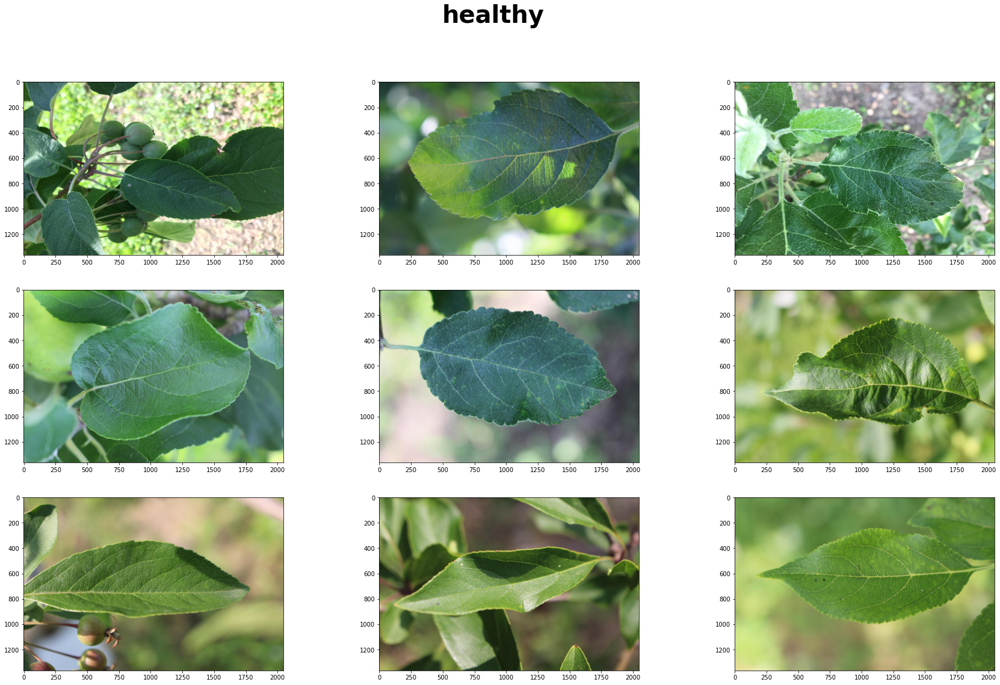

In [15]:
visualize_sample(diseases[0])

- Phân tích trực quan đặt điểm của cây không bị bệnh
    - Lá cây xanh đều, không chứa các đốm màu khác thường
    - Bề mặt nhẵn, không chứa biến dạng
    - Xương lá không bị biến sắc hay biến dạng
    - Hình dạng lá nguyên vẹn, không bị mất mát, biến dạng, biến sắc

#### Multiple Diseases Leaves

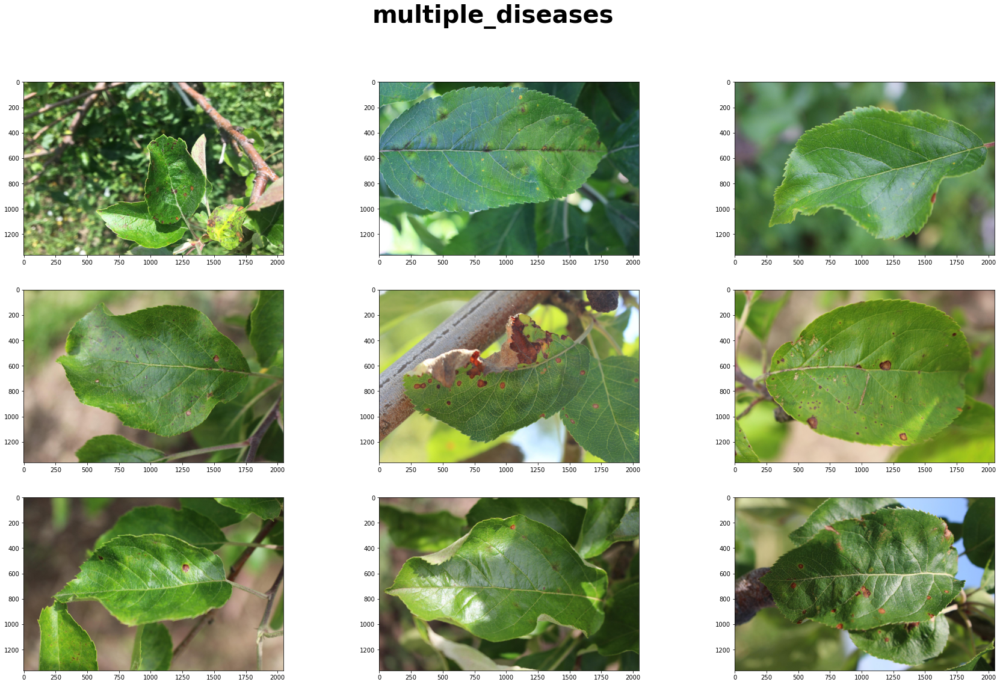

In [16]:
visualize_sample(diseases[1])

- Phân tích trực quan đặc điểm của cây mắc **Multiple_diseases**
    - Bề mặt lá chứa các đốm bệnh có màu sắc bất thường (đen, nâu,...), có thể bị biến dạng (cong, co lại bất thường,...)
    - Có thể tồn tại các đốm bệnh chạy dọc xương lá
    - Hình dáng lá bị biến dạng (bị cắt góc, cháy xém,...)

#### Rust Leaves

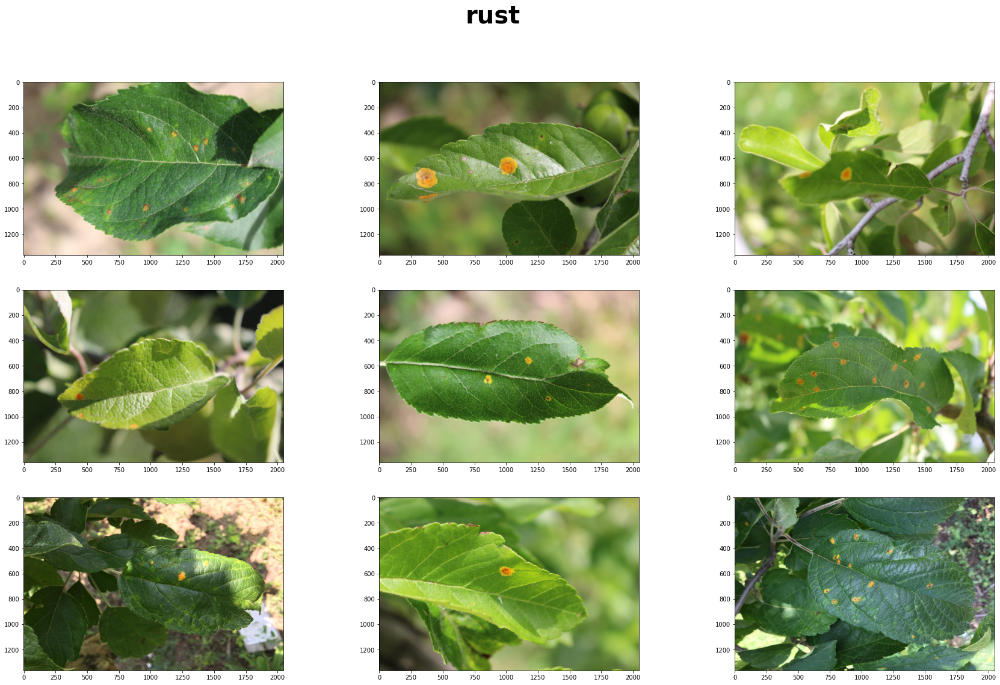

In [17]:
visualize_sample(diseases[2])

- Phân tích trực quan đặc điểm cây bị bệnh **rust**
    - Bề mặt lá xuất hiện các đốm màu nâu, vàng
    - Các đốm này xuất hiện thành từng cụm, lan rộng về mật độ và diện tích từng đốm
    - Các đốm xuất hiện ở cả mặt trước và mặt sau của lá

#### Scab Leaves

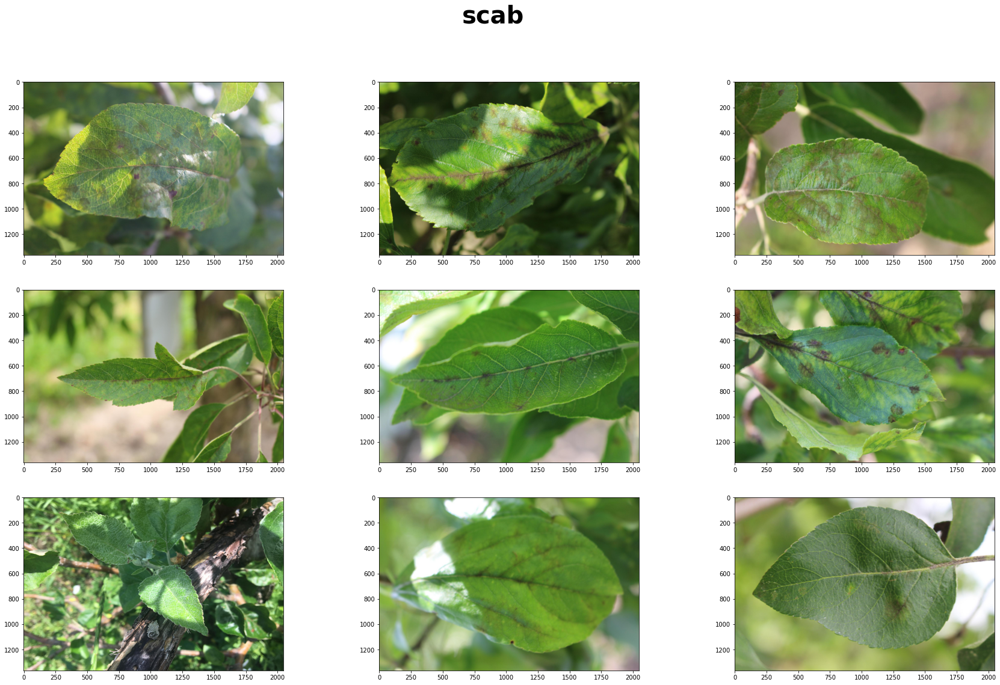

In [18]:
visualize_sample(diseases[3])

- Phân tích trực quan đặc điểm của bệnh **scab**
    - Các vết bệnh sẫm màu, xanh ô liu, tím hoặc đen trên lá, thường có hình dạng bất thường và trở nên đen khi quá nặng
    - Các vết đốm bệnh chạy dọc xương lá. Khi lan rộng thì tỏa khắp mặt lá

## Model

### Split Training Data

In [19]:
if os.path.isdir(TRAIN_PATH) is False:
    # Create train, validation, test folders
    os.mkdir(TRAIN_PATH)    
    os.mkdir(VALID_PATH)
    os.mkdir(TEST_PATH)
    
    # Copy test images to test folder
    for img_id in test['image_id']:
      shutil.copy(f'{DATA_PATH}/images/{img_id}', TEST_PATH)

    for disease in diseases:
        # Create disease(healthy, multi-diseases, rust, scab) folder
        os.mkdir(f'{TRAIN_PATH}/{disease}')
        os.mkdir(f'{VALID_PATH}/{disease}')
        os.mkdir(f'{TEST_PATH}/{disease}')
        
        # Get all image have disease = 1
        images_id = train[train[disease] == 1].image_id.values

        # Split data
        train_id, valid_id = train_test_split(images_id, test_size = VALID_RATIO)

        # Copy training images to train folder
        for img_id in train_id:
            shutil.copy(f'{DATA_PATH}/images/{img_id}', f'{TRAIN_PATH}/{disease}')
        
        # Copy validation images to validation folder
        for img_id in valid_id:
            shutil.copy(f'{DATA_PATH}/images/{img_id}', f'{VALID_PATH}/{disease}')

## Create Data Batches

In [20]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# đọc dữ liệu và trực quan một vài mẫu
train_datagen = ImageDataGenerator(rescale=1/255,
                              rotation_range=40,
                              width_shift_range=.2,
                              height_shift_range=.2,
                              shear_range=.2,
                              zoom_range=.2,
                              horizontal_flip=True,
                              fill_mode='nearest')
train_data = train_datagen.flow_from_directory(TRAIN_PATH,
                                               target_size=IMAGE_SIZE,
                                               batch_size=BATCH_SIZE,
                                               class_mode='categorical')
N_TRAIN_SAMPLE = train_data.samples

valid_datagen = ImageDataGenerator(rescale=1/255,
                                        rotation_range=40,
                                        width_shift_range=.2,
                                        height_shift_range=.2,
                                        shear_range=.2,
                                        zoom_range=.2,
                                        horizontal_flip=True,
                                        fill_mode='nearest')
valid_data = valid_datagen.flow_from_directory(VALID_PATH,
                                             target_size=IMAGE_SIZE,
                                             batch_size=BATCH_SIZE, 
                                             class_mode='categorical')


N_VALID_SAMPLE = valid_data.samples

test_datagen = ImageDataGenerator(rescale=1/255)
test_data=test_datagen.flow_from_dataframe(test,
                                          directory=TEST_PATH,
                                          target_size=IMAGE_SIZE,
                                          x_col="image_id",
                                          y_col=None,
                                          class_mode=None,
                                          shuffle=False,
                                          batch_size=BATCH_SIZE)


N_TEST_SAMPLE = test_data.samples

Found 1636 images belonging to 4 classes.
Found 185 images belonging to 4 classes.
Found 1821 validated image filenames.


(32, 300, 300, 3)
(32, 300, 300, 3)
(32, 300, 300, 3)
(32, 300, 300, 3)
(32, 300, 300, 3)


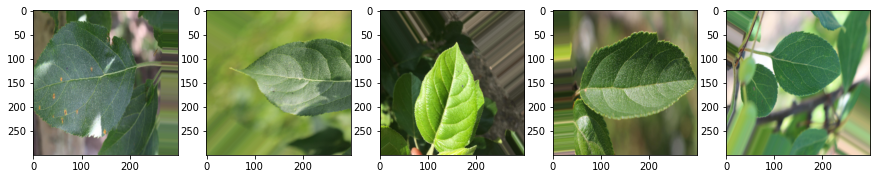

In [21]:
fig, axs = plt.subplots(1,5, figsize=(15,5))
 
for i in range(5):
    img, label = train_data.next()
    print(img.shape)
    axs[i].imshow(img[0])

### Init Model

In [22]:
pretrained_model = tf.keras.applications.ResNet152V2(
    include_top=False,
    weights='imagenet',
    input_shape=IMAGE_SHAPE
)
pretrained_model.trainable = True

model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.AveragePooling2D(),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(64, activation="relu"),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(4, activation='softmax')
])

model.summary()

234553344/234545216 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet152v2 (Functional)     (None, 10, 10, 2048)      58331648  
_________________________________________________________________
average_pooling2d (AveragePo (None, 5, 5, 2048)        0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                131136    
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_2 (Dense)              (None, 4)                 132       
Total params: 58,464,996
Trainable params: 58,321,252
N

In [23]:
# define a callback class
class myCallBacks(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        
        if logs.get('accuracy') >= MAX_ACC:
            print(f'accuracy reached {MAX_ACC * 100}%. Stop learning')
            self.model.stop_training = True

callback = myCallBacks()

### Training

In [24]:

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=BASE_LEARNING_RATE),
              loss=['categorical_crossentropy'],
              metrics=['accuracy'])

model.fit(train_data,
          steps_per_epoch=(N_TRAIN_SAMPLE//BATCH_SIZE),
          epochs=30,
          validation_data = valid_data,
          validation_steps=(N_VALID_SAMPLE//BATCH_SIZE),
          callbacks=[callback])


Epoch 1/30
51/51 [==============================] - 160s 2s/step - loss: 0.7065 - accuracy: 0.7556 - val_loss: 3.4623 - val_accuracy: 0.5938
Epoch 2/30
51/51 [==============================] - 108s 2s/step - loss: 0.2900 - accuracy: 0.9009 - val_loss: 0.8770 - val_accuracy: 0.8125
Epoch 3/30
51/51 [==============================] - 108s 2s/step - loss: 0.2522 - accuracy: 0.9202 - val_loss: 0.5220 - val_accuracy: 0.9125
Epoch 4/30
51/51 [==============================] - 108s 2s/step - loss: 0.2010 - accuracy: 0.9395 - val_loss: 0.5481 - val_accuracy: 0.8813
Epoch 5/30
51/51 [==============================] - 108s 2s/step - loss: 0.2145 - accuracy: 0.9308 - val_loss: 0.6191 - val_accuracy: 0.8375
Epoch 6/30
51/51 [==============================] - 109s 2s/step - loss: 0.1132 - accuracy: 0.9589 - val_loss: 0.3139 - val_accuracy: 0.9000
Epoch 7/30
51/51 [==============================] - 108s 2s/step - loss: 0.1560 - accuracy: 0.9470 - val_loss: 0.3348 - val_accuracy: 0.8938
Epoch 8/30
51

### Create Submit File

In [25]:
def create_submit(model, name):
  submit = pd.read_csv(f"{DATA_PATH}/sample_submission.csv")
  probs = model.predict(test_data, verbose=1)
  submit.loc[:, 'healthy':] = probs
  submit.to_csv(f'submission_{name}.csv', index=False)
  submit.head()

### Download Pretrained Models

In [26]:
if os.path.isdir("./pretrained") is False:
  !gdown --id 1CZ6EV53gaSHz8XycL2WEEoYqscHXVl1s
  !unzip pretrained.zip
  !rm pretrained.zip

Downloading...
From: https://drive.google.com/uc?id=1CZ6EV53gaSHz8XycL2WEEoYqscHXVl1s
To: /content/pretrained.zip
1.98GB [00:24, 81.2MB/s]
Archive:  pretrained.zip
   creating: pretrained/
  inflating: pretrained/InceptionV3.h5  
  inflating: pretrained/MobileNetV2.h5  
  inflating: pretrained/InceptionResNetV2.h5  
  inflating: pretrained/resnet101V2.h5  
  inflating: pretrained/ResNet152V2.h5  


### Prediction

In [27]:
from tensorflow import keras
for model_name in os.listdir('./pretrained'):
  model1 = keras.models.load_model(f'./pretrained/{model_name}')
  create_submit(model1, model_name[:-3])

57/57 [==============================] - 62s 1s/step


In [32]:
  create_submit(model, "ResNet152V2_real_time_training")

57/57 [==============================] - 59s 1000ms/step


### Submissions

In [35]:
!pip install -q kaggle
!mkdir .kaggle
!touch .kaggle/kaggle.json

api_token = {"username":"monkeydson","key":"910620ca7c8926d00d20af8c6a770830"}

import json
import zipfile
import os
with open('.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!mv .kaggle /root/

!kaggle competitions submit -c plant-pathology-2020-fgvc7 -f submission_InceptionResNetV2.csv -m InceptionResNetV2
!kaggle competitions submit -c plant-pathology-2020-fgvc7 -f submission_InceptionV3.csv -m InceptionV3
!kaggle competitions submit -c plant-pathology-2020-fgvc7 -f submission_MobileNetV2.csv -m MobileNetV2
!kaggle competitions submit -c plant-pathology-2020-fgvc7 -f submission_ResNet152V2.csv -m ResNet152V2
!kaggle competitions submit -c plant-pathology-2020-fgvc7 -f submission_resnet101V2.csv -m resnet101V2

# Real time submission
!kaggle competitions submit -c plant-pathology-2020-fgvc7 -f submission_ResNet152V2_real_time_training.csv -m "ResNet152V2 Real Time submission"

mkdir: cannot create directory ‘.kaggle’: File exists
mv: cannot move '.kaggle' to '/root/.kaggle': Directory not empty
100% 156k/156k [00:00<00:00, 508kB/s]
Successfully submitted to Plant Pathology 2020 - FGVC7Warning: Your Kaggle API key is readable by other users on this system! To fix this, you can run 'chmod 600 /root/.kaggle/kaggle.json'
100% 167k/167k [00:00<00:00, 544kB/s]
Successfully submitted to Plant Pathology 2020 - FGVC7Warning: Your Kaggle API key is readable by other users on this system! To fix this, you can run 'chmod 600 /root/.kaggle/kaggle.json'
100% 163k/163k [00:00<00:00, 532kB/s]
Successfully submitted to Plant Pathology 2020 - FGVC7Warning: Your Kaggle API key is readable by other users on this system! To fix this, you can run 'chmod 600 /root/.kaggle/kaggle.json'
100% 166k/166k [00:00<00:00, 540kB/s]
Successfully submitted to Plant Pathology 2020 - FGVC7Warning: Your Kaggle API key is readable by other users on this system! To fix this, you can run 'chmod 600

In [36]:
!kaggle competitions submissions -c plant-pathology-2020-fgvc7

fileName                                       date                 description                       status    publicScore  privateScore  
---------------------------------------------  -------------------  --------------------------------  --------  -----------  ------------  
submission_ResNet152V2_real_time_training.csv  2021-06-06 15:10:31  ResNet152V2 Real Time submission  complete  0.92513      0.92758       
submission_resnet101V2.csv                     2021-06-06 15:10:29  resnet101V2                       complete  0.92410      0.93794       
submission_ResNet152V2.csv                     2021-06-06 15:10:28  ResNet152V2                       complete  0.93392      0.94080       
submission_MobileNetV2.csv                     2021-06-06 15:10:26  MobileNetV2                       complete  0.92592      0.92132       
submission_InceptionV3.csv                     2021-06-06 15:10:24  InceptionV3                       complete  0.93327      0.91775       
submission_Inception